# PYTHON PROGRAMMING


In [72]:
# 한글 찍기
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

%pip install koreanize-matplotlib
from koreanize_matplotlib import koreanize
koreanize()

Note: you may need to restart the kernel to use updated packages.


## subwayfee.csv 파일을 통한 지하철 유무임별 이용현황 데이터 분석

- 자료출처 : t-money.co.kr 에서 자료를 제공함. encoding = 'cp949'

In [30]:
df = pd.read_csv('data/subwayfee.csv', encoding = 'cp949')
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764
1,2019-01,1호선,151,시청,676932,676266,102388,101033
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687
...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109


## 실습 0. 유임승차, 유임하차, 무임승차, 무임하차 4가지 별로,  각각 가장 많은 역을 찾아보세요.

## 실습 1. 무임승차 대비 유임승차 비율이 가장 높은 역은 어디입니까?

In [31]:
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764
1,2019-01,1호선,151,시청,676932,676266,102388,101033
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687
...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109


In [32]:
df['역ID'].nunique()

598

In [33]:
df['지하철역'].nunique()

509

In [34]:
df['지하철역'].value_counts()

지하철역
서울역         6
홍대입구        4
공덕          4
김포공항        4
종로3가        3
           ..
서초          1
잠실새내        1
방배          1
삼성(무역센터)    1
종각          1
Name: count, Length: 509, dtype: int64

In [38]:
df['비율'] = df['유임승차'] / df['무임승차']

In [40]:
df.sort_values('비율', ascending=False)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
329,2019-01,경의선,1293,홍대입구,2,0,0,0,inf
330,2019-01,경의선,1295,김포공항,10,0,0,0,inf
331,2019-01,경의선,1296,계양,7,0,0,0,inf
332,2019-01,경의선,1297,검암,5,0,0,0,inf
266,2019-01,일산선,1949,지축,2,0,0,0,inf
...,...,...,...,...,...,...,...,...,...
301,2019-01,장항선,1407,온양온천,84623,85690,73363,73626,1.153483
591,2019-01,우이신설선,4707,삼양사거리,37572,38401,35436,36998,1.060278
295,2019-01,중앙선,1219,용문,36259,36316,34572,34257,1.048797
7,2019-01,1호선,157,제기동,293540,288217,374571,400607,0.783670


In [45]:
df.loc[df['무임승차'] != 0,].sort_values('비율', ascending=False)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
72,2019-01,3호선,321,충무로,55,0,2,0,27.500000
48,2019-01,2호선,239,홍대입구,2351935,2507561,114832,111488,20.481530
560,2019-01,공항철도 1호선,4203,홍대입구,336328,335507,17545,17112,19.169450
566,2019-01,공항철도 1호선,4210,청라국제도시,174320,164483,9921,9676,17.570809
120,2019-01,경부선,1001,서울역,178223,29980,10325,1612,17.261308
...,...,...,...,...,...,...,...,...,...
301,2019-01,장항선,1407,온양온천,84623,85690,73363,73626,1.153483
591,2019-01,우이신설선,4707,삼양사거리,37572,38401,35436,36998,1.060278
295,2019-01,중앙선,1219,용문,36259,36316,34572,34257,1.048797
7,2019-01,1호선,157,제기동,293540,288217,374571,400607,0.783670


## 실습 2. 전체승차인원(유임+무임)이 만명이상인 역 중, 유임승차 비율이 가장 높은 역은 어디입니까?

In [46]:
df['전체승차인원'] = df['유임승차'] + df['무임승차']

In [50]:
df.loc[ df['전체승차인원'] >= 10000 , ].sort_values('비율', ascending=False)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율,전체승차인원
48,2019-01,2호선,239,홍대입구,2351935,2507561,114832,111488,20.481530,2466767
560,2019-01,공항철도 1호선,4203,홍대입구,336328,335507,17545,17112,19.169450,353873
566,2019-01,공항철도 1호선,4210,청라국제도시,174320,164483,9921,9676,17.570809,184241
120,2019-01,경부선,1001,서울역,178223,29980,10325,1612,17.261308,188548
557,2019-01,9호선,4125,신논현,965930,995451,57013,54557,16.942276,1022943
...,...,...,...,...,...,...,...,...,...,...
301,2019-01,장항선,1407,온양온천,84623,85690,73363,73626,1.153483,157986
591,2019-01,우이신설선,4707,삼양사거리,37572,38401,35436,36998,1.060278,73008
295,2019-01,중앙선,1219,용문,36259,36316,34572,34257,1.048797,70831
7,2019-01,1호선,157,제기동,293540,288217,374571,400607,0.783670,668111


## 실습 3. 모든 역의 유임승차, 유임하차, 무임 승차, 무임하차, 총 4개를, 파이차트로 나타내세요.

In [73]:
data

유임승차    1293198
유임하차    1324547
무임승차     146482
무임하차     143369
Name: 49, dtype: object

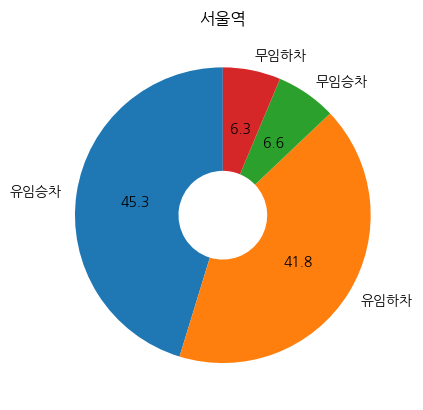

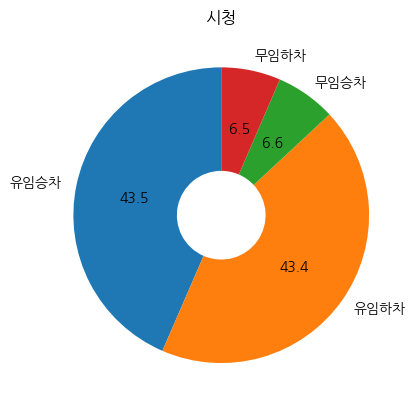

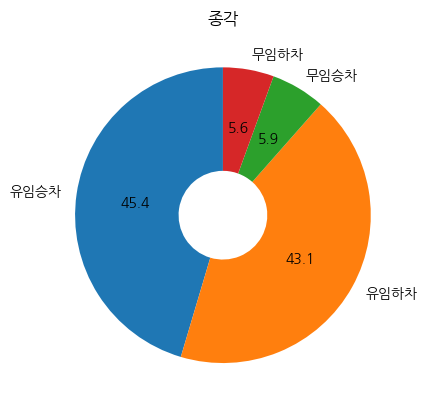

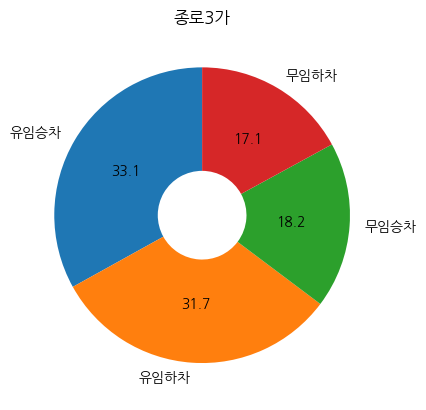

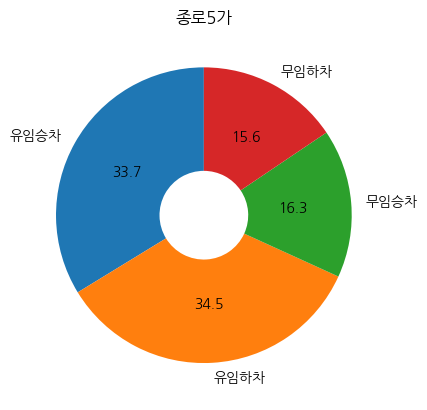

...

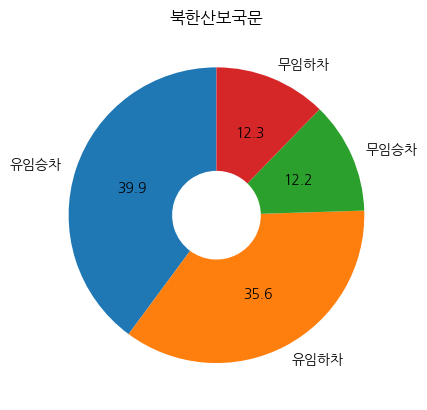

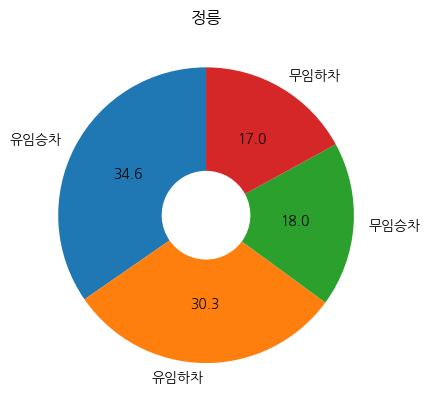

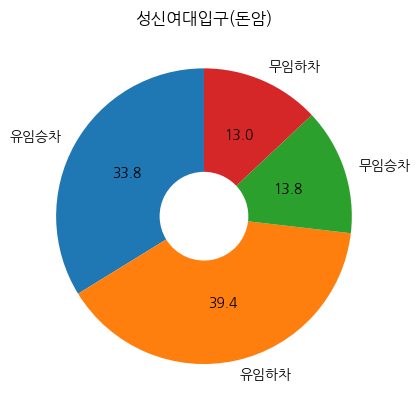

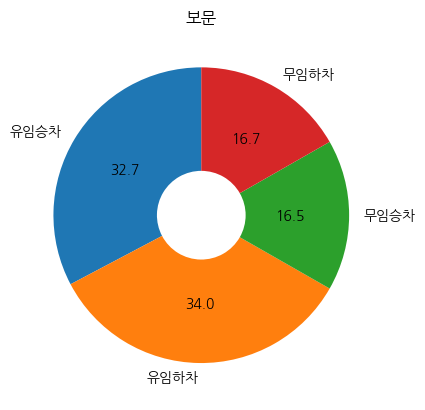

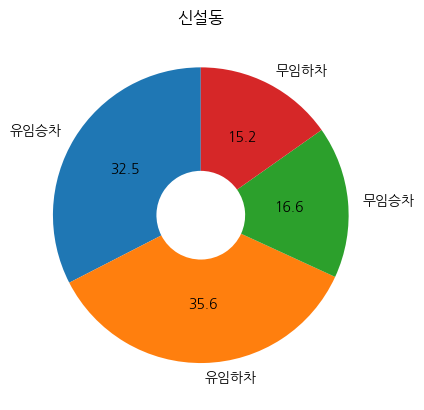

In [74]:
for index in range(0, 598):
    data = df.loc[index,'유임승차':'무임하차']
    plt.pie(data, labels=data.index, startangle=90, wedgeprops={'width':0.7}, autopct='%.1f')
    plt.title(df.loc[index,'지하철역'])
    plt.show()

In [51]:
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율,전체승차인원
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764,6.856190,1737632
1,2019-01,1호선,151,시청,676932,676266,102388,101033,6.611439,779320
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062,7.639985,1403220
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735,1.816531,1090172
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687,2.075986,847271
...,...,...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629,3.263665,172235
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092,1.922061,126984
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648,2.441451,108595
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109,1.981258,47402
